In [1]:
# Load model used in the paper.
import os
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from IPython.display import display, HTML

new_directory_path = '/home/modalyeon/aiffelthon/fromage'
os.chdir(new_directory_path)

from fromage import models, utils



/home/modalyeon/anaconda3/envs/end_fromage/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# model_dir = '/home/modalyeon/aiffelthon/fromage/fromage_model/fromage_vis4/'
model_dir = '/home/modalyeon/aiffelthon/fromage/runs/fromage_exp/' # 결과 나온 모델 폴더 지정

model = models.load_fromage(model_dir)

Using HuggingFace AutoFeatureExtractor for openai/clip-vit-large-patch14.
Using facebook/opt-6.7b for the language model.
Using openai/clip-vit-large-patch14 for the visual model with 1 visual tokens.
Freezing the LM.
Initializing embedding for the retrieval token [RET] (id = 50266).
Restoring pretrained weights for the visual model.
Freezing the VM.


input : recommend red
output: I recommend red.


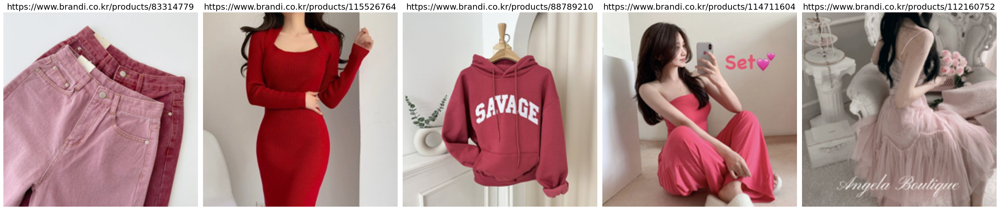

input : recommend white


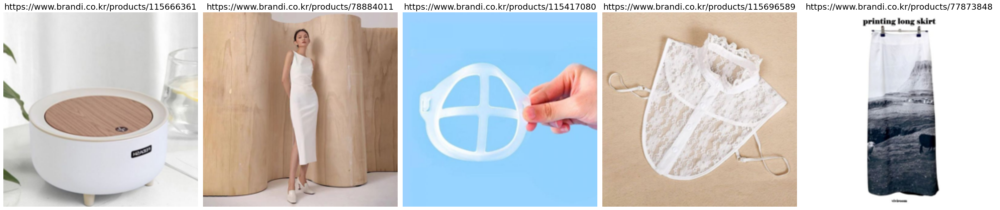

input : recommend black
output: Black is a great option for those who want


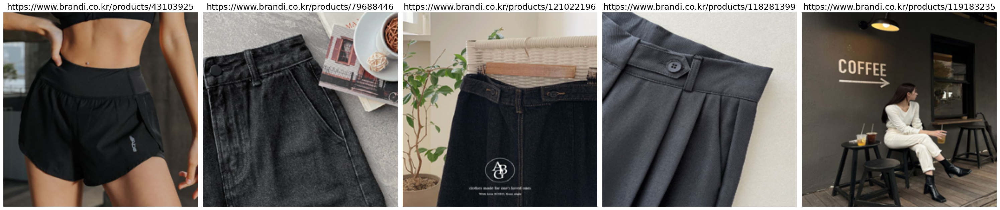

input : recommend jacket


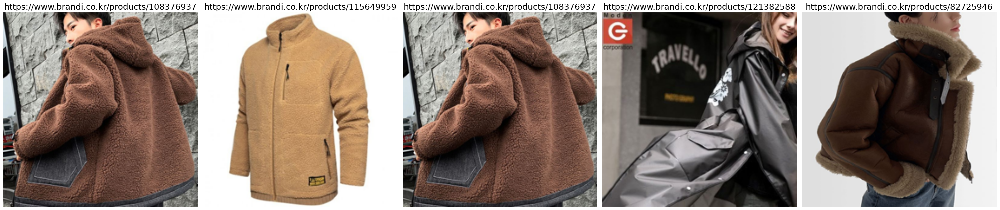

input : recommend shirt


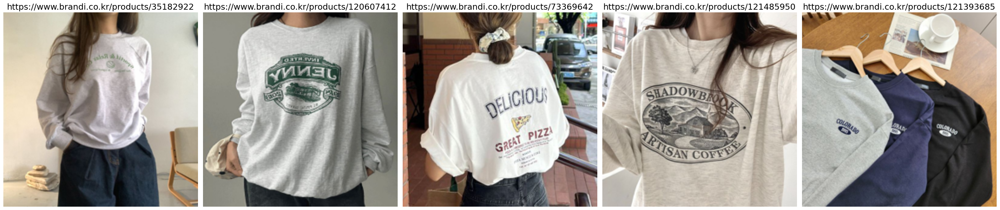

input : recommend pants


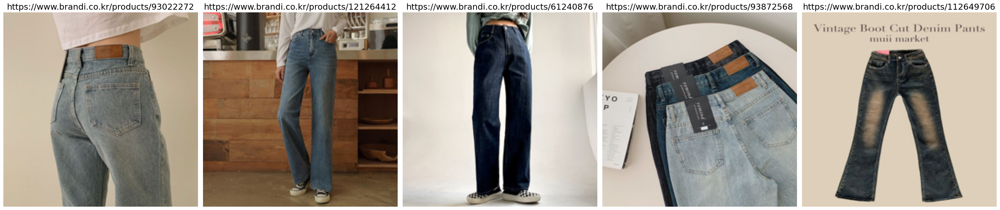

input : recommend dress


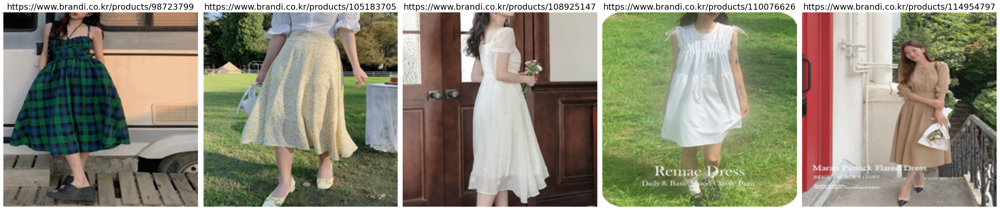

input : recommend skirt


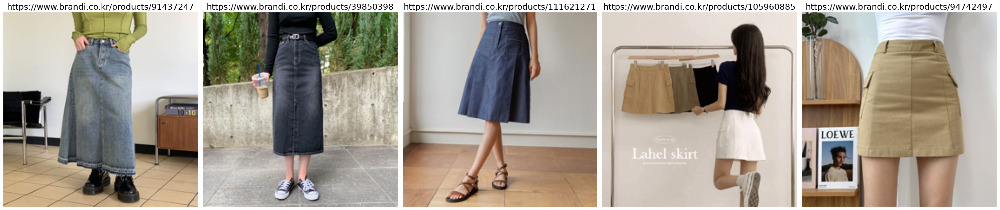

input : q


In [3]:
ret_scale_factor = 1  # Increase this hyperparameter to upweight the probability of FROMAGe returning an image.

input_context = []
all_outputs = []
text = ''
while True:
    inp = input()
    print(f'input : {inp}')
    if inp == 'q':
        break
    if inp.replace(' ','') == '':
        print('input something')
        continue

    # Add Q+A prefixes for prompting. This is helpful for generating dialogue.
    text = f'Q: {inp}\nA:'
    # Concatenate image and text.
    if 'url' in inp:
        try: # https://img1.shopcider.com/product/1648005693000-bPswiA.jpg
            input_context = [utils.get_image_from_url(inp.split('url')[-1])]
            plt.subplot(1,1,1)
            plt.imshow(input_context[0])
            plt.axis('off')
            plt.show()
        except:
            print(f'{inp.split("url")[-1]} is not image url')

    model_prompt = input_context + [text]

    if 'recommend' in inp:
        model_outputs = model.generate_for_images_and_texts(
            model_prompt, num_words=32, ret_scale_factor=ret_scale_factor*2, max_num_rets=5,temperature=0.5)
    else:
        model_outputs = model.generate_for_images_and_texts(
            model_prompt, num_words=32, ret_scale_factor=0)

    lens = len(model_outputs)
    plt.figure(figsize=(lens*1.5, lens*3))  # 원하는 크기로 설정 (픽셀 단위)
    if lens == 1:
        text += ' '.join([model_outputs[0]]) + '\n'
        print(f'output:{model_outputs[0]}')
    else:
        for i in range(lens):
            if i % 3 == 0:
                if i == 0:
                    if model_outputs[0] not in [' [RET]', ' ']:
                        print(f'output:{model_outputs[0][:-6]}')
                        text += ' '.join([model_outputs[0]]) + '\n'
                    else:
                        text += '\n'
            elif i % 3 == 1:
                plt.subplot(1, lens // 3, i // 3 + 1)
                plt.title(f'{model_outputs[i+1][0]}', fontsize=lens*1.2)
                plt.imshow(model_outputs[i][0])
                plt.axis('off')
            else:
                continue
        
        plt.tight_layout()  # 레이아웃 조정
        plt.show()


    #html 형식 max_img_per_ret
    # if lens == 1:
    #     text += ' '.join([model_outputs[0]]) + '\n'
    #     print(f'output:{model_outputs[0]}')
    # else:
    #     text += ' '.join([model_outputs[0]]) + '\n'
    #     html_code = '<div style="display: flex; flex-wrap: wrap;">'
    #     for i in range(len(model_outputs[1])):
    #         html_code += f'<div style="margin: 10px;"><img src="{model_outputs[1][i]}" alt="image" style="width: 200px;"><br><a href="{model_outputs[2][i]}" target="_blank">구매 링크</a></div>'
    #     html_code += '</div>'
        # display(HTML(html_code))

